# STREAMLIT PARTE 2

### Aula 1:
- Apresentação do dataset
- Apresentação da ferramenta final

### Aula 2:
- Parte 1:
    - 1 coluna como filtro
    - st.set_page_config()
    - st.image()
    - st.slider()
    - st.pyplot()
- Parte 2:
    - 2 colunas como filtro
    - st.multiselect()
- Parte 3:
    - st.form()
    - st.form_submit_button()
    - sns.set_theme()

### Aula 3:
- 9 colunas como filtro


### Aula 4:
- pip install --upgrade streamlit
- pip install --upgrade matplotlib
- st.cache()


### Aula 5:
- st.file_uploader()


### Aula 6:
- st.download_button()


### Aula 7:
- st.columns()
- st.radio()


In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


In [5]:
bank_raw = pd.read_csv(r"C:\Users\earap\Documents\EBAC\DataScienceExcercises\modulo_19_streamlit_ii\data\input\bank-additional-full.csv", delimiter=';')
# se executado pelo jupyter alterar o formato da exportação do arquivo para:
# bank = pd.read_csv('./data/input/bank-additional-full.csv', sep=';')

bank = bank_raw.copy()


In [6]:
bank_raw.head(1)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [7]:
# IDADES
max_age = int(bank.age.max())
min_age = int(bank.age.min())
print(min_age,max_age)

17 98


In [8]:
bank_raw.shape

(41188, 21)

In [9]:
idades = [min_age,26]

In [10]:
bank = bank[(bank['age'] >= idades[0]) & (bank['age'] <= idades[1])]

In [11]:
bank.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
11,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
59,25,technician,single,university.degree,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
160,24,management,single,university.degree,no,yes,no,telephone,may,mon,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [12]:
bank.shape


(2364, 21)

In [13]:
bank_raw_target_perc = bank_raw.y.value_counts(normalize = True).to_frame()*100
bank_raw_target_perc = bank_raw_target_perc.sort_index()
bank_raw_target_perc

,proportion
y,
no,88.734583
yes,11.265417


In [14]:
bank_target_perc = bank.y.value_counts(normalize = True).to_frame()*100
bank_target_perc = bank_target_perc.sort_index()
bank_target_perc

,proportion
y,
no,80.076142
yes,19.923858


Text(0.5, 1.0, 'Dados filtrados')

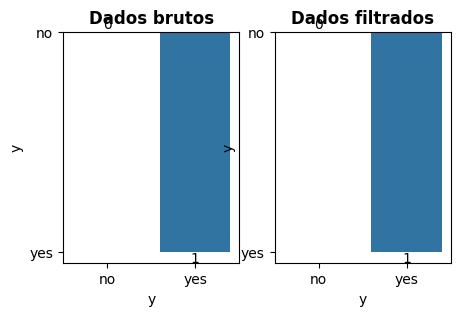

In [15]:
# # PLOTS
fig, ax = plt.subplots(1, 2, figsize = (5,3))


sns.barplot(x = bank_raw_target_perc.index,
            y = 'y',
            data = bank_raw_target_perc,
            ax = ax[0])
ax[0].bar_label(ax[0].containers[0])
ax[0].set_title('Dados brutos',
                fontweight ="bold")


sns.barplot(x = bank_target_perc.index,
            y = 'y',
            data = bank_target_perc,
            ax = ax[1])
ax[1].bar_label(ax[1].containers[0])
ax[1].set_title('Dados filtrados',
                fontweight ="bold")

**Aula 2 - Parte II: Aplicação Inicial - Parte 2**

In [16]:
idades = [17,98]

In [17]:
bank.head(2)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [18]:
bank.job.unique().tolist()

['technician',
 'services',
 'management',
 'admin.',
 'blue-collar',
 'housemaid',
 'unemployed',
 'student',
 'entrepreneur',
 'self-employed',
 'unknown',
 'retired']

In [19]:
jobs_list = bank.job.unique().tolist()
jobs_list.append('all')
print('PROFISSÕES DISPONIVEIS:', jobs_list)

PROFISSÕES DISPONIVEIS: ['technician', 'services', 'management', 'admin.', 'blue-collar', 'housemaid', 'unemployed', 'student', 'entrepreneur', 'self-employed', 'unknown', 'retired', 'all']


In [20]:
jobs_selected = ['all']
jobs_selected

['all']

In [21]:
bank = bank_raw.copy()
bank.shape

(41188, 21)

In [22]:
jobs_selected = jobs_list
jobs_selected = ['housemaid','services']

In [23]:
bank = bank_raw.copy()
bank.shape

(41188, 21)

In [24]:
# bank = bank[(bank['age'] >= idades[0]) & (bank['age'] <= idades[1])]

bank = bank[bank['job'].isin(jobs_selected)].reset_index(drop=True)

In [25]:
bank.shape

(5029, 21)

**Aula 2 - Parte III: Aplicação Inicial**

In [26]:
bank = bank_raw.copy()
bank.shape

(41188, 21)

In [27]:
if 'all' in jobs_selected:
    pass
else:
    bank = bank[bank['job'].isin(jobs_selected)].reset_index(drop=True)

In [28]:
bank.shape

(5029, 21)

**Aula 3: 9 Colunas como filtro**

In [29]:
bank[['age','job','marital','default','housing','loan','contact','month','day_of_week','y']]

,age,job,marital,default,housing,loan,contact,month,day_of_week,y
0,56,housemaid,married,no,no,no,telephone,may,mon,no
1,57,services,married,unknown,no,no,telephone,may,mon,no
2,37,services,married,no,yes,no,telephone,may,mon,no
3,56,services,married,no,no,yes,telephone,may,mon,no
4,45,services,married,unknown,no,no,telephone,may,mon,no
...,...,...,...,...,...,...,...,...,...,...
5024,31,housemaid,single,no,no,no,telephone,nov,mon,no
5025,31,housemaid,single,no,no,no,cellular,nov,mon,no
5026,38,housemaid,divorced,no,no,no,cellular,nov,wed,yes
5027,62,services,married,no,yes,no,cellular,nov,wed,no


In [30]:
bank.day_of_week.unique().tolist()

['mon', 'tue', 'wed', 'thu', 'fri']

**Aula 4: st.cache()**

In [31]:
bank_maior = pd.concat([bank]*20,ignore_index=True)
bank_maior

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100575,31,housemaid,single,university.degree,no,no,no,telephone,nov,mon,...,5,999,0,nonexistent,-1.1,94.767,-50.8,1.039,4963.6,no
100576,31,housemaid,single,university.degree,no,no,no,cellular,nov,mon,...,4,999,0,nonexistent,-1.1,94.767,-50.8,1.039,4963.6,no
100577,38,housemaid,divorced,university.degree,no,no,no,cellular,nov,wed,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.030,4963.6,yes
100578,62,services,married,high.school,no,yes,no,cellular,nov,wed,...,5,999,0,nonexistent,-1.1,94.767,-50.8,1.030,4963.6,no


In [32]:
bank_maior.shape

(100580, 21)

In [33]:
bank_maior.to_csv('./data/input/bank-additional-full-40.csv',index=False, sep=';')

**Aula 5: st.file_uploader()**

In [34]:
## diretamente nos códigos do streamlit

**Aula 7: st.download_button()**

In [35]:
bank = pd.read_csv("bank-additional-full.csv", delimiter=';')
# se executado pelo jupyter alterar o formato da exportação do arquivo para:
# bank = pd.read_csv('./data/input/bank-additional-full.csv', sep=';')

bank.head(10)


FileNotFoundError: [Errno 2] No such file or directory: 'bank-additional-full.csv'

In [ ]:
a = bank.to_csv()
a

',age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y\n0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,198,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,139,1,999,0,nonexistent,1.1,93.99

In [ ]:
type(a)

str

In [ ]:
b = a.encode('utf-8')
b

b',age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y\n0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,198,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no\n6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,139,1,999,0,nonexistent,1.1,93.9

In [ ]:
type(b)

bytes

In [ ]:
from io                     import BytesIO

In [ ]:
pip install XlsxWriter


In [ ]:
output = BytesIO()
writer = pd.ExcelWriter(output, engine='xlsxwriter')

In [ ]:
bank.to_excel(writer, index=False, sheet_name='Sheet1')

In [ ]:
writer

In [ ]:
writer.save()

<ipython-input-42-16d93d5523a4>:1: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()


In [ ]:
processed_data = output.getvalue()

In [ ]:
processed_data[:100]

b'PK\x03\x04\x14\x00\x00\x00\x08\x00\x00\x00?\x00a]I:O\x01\x00\x00\x8f\x04\x00\x00\x13\x00\x00\x00[Content_Types].xml\xad\x94\xcbn\xc20\x10E\xf7\xfd\x8a\xc8\xdb*1tQU\x15\x81E\x1f\xcb\x16\xa9\xf4\x03\\{B,\x1c\xdb\xf2\x0c\x14\xfe\xbe\x93\xf0P[Q\xa0\x82M\xacd\xee\xdcs'

In [ ]:
a=bank.y.value_counts(normalize=True).to_frame()
a

,y
no,0.887346
yes,0.112654


In [ ]:
a.plot.pie(y = 'y',ax=ax[1])

<Axes: title={'center': 'Dados filtrados'}, ylabel='y'>

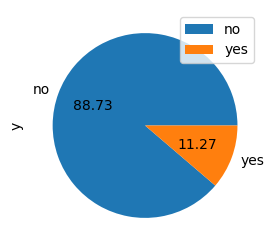

In [ ]:
fig, ax = plt.subplots(1, 1, figsize = (5,3))
a.plot(kind='pie', autopct='%.2f', y='y', ax = ax)
plt.show()

<Axes: >

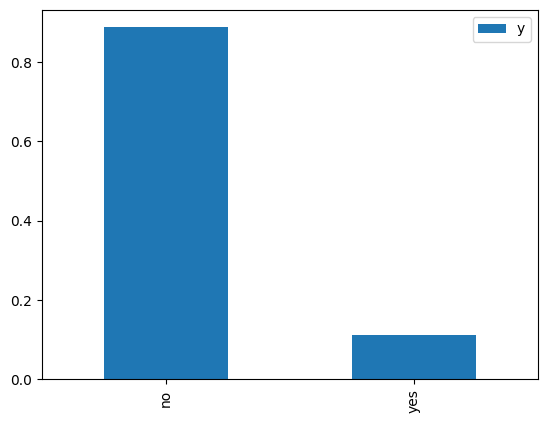

In [ ]:
a.plot(kind='bar')

**Aula 7: st.collumns() e st.radio()**

In [ ]:
## diretamente nos códigos do streamlit